# AlphaZero

This notebook is based on the paper:

* [Mastering the game of Go without Human Knowledge](https://deepmind.com/research/publications/mastering-game-go-without-human-knowledge/)

with additional insight from:

* https://deepmind.com/blog/alphago-zero-learning-scratch/
* https://applied-data.science/blog/how-to-build-your-own-alphazero-ai-using-python-and-keras/
* https://github.com/AppliedDataSciencePartners/DeepReinforcementLearning
* https://github.com/junxiaosong/AlphaZero_Gomoku/blob/master/mcts_alphaZero.py


This code use the [Conx](http://conx.readthedocs.io/en/latest/) Python layer that sits on top of Keras. Conx is designed to be simpler than Keras, more intuitive, and has useful integrated visualizations to help understanding.

Note: currently this code requires the TensorFlow backend, as it has a function specific to its implementation.

## The Game

First, let's look at a specific game. AlphaZero has been applied to Chess and Go. For demonstration purposes, we will pick an easier game so that we can show learning progress more quickly. We can use many games, but for this demonstration we'll pick ConnectFour. There is a good code base of different games and a game engine in the [code](https://github.com/Calysto/aima3/) based on [Artificial Intelligence: A Modern Approach](http://aima.cs.berkeley.edu/).

If you would like to install aima3, you can use something like this in a cell:

```bash
! pip install aima3 -U --user
```

aima3 has other games that you can play as well as ConnectFour, including TicTacToe. 
aima3 has many AI algorithms wrapped up to play games. You can see more details about the game engine and ConnectFour here:

* https://github.com/Calysto/aima3/blob/master/notebooks/games.ipynb
* https://github.com/Calysto/aima3/blob/master/notebooks/connect_four.ipynb

and other resources in that repository.

We import some of these that will be useful in our AlphaZero exploration:

In [1]:
# for the games an players:
from aima3.games import (ConnectFour, RandomPlayer, MCTSPlayer,
                         Player, MiniMaxPlayer, 
                         AlphaBetaPlayer, AlphaBetaCutoffPlayer, 
                         GameState, HumanPlayer)
# for a config data structure:
from collections import namedtuple
# for manipulating inputs and targets:
import numpy as np
# the neural network package:
import conx as cx
# for the error/loss function:
from keras import regularizers
import tensorflow as tf

Using TensorFlow backend.
ConX, version 3.7.5


Let's make a game:

In [2]:
game = ConnectFour(notebook=True)

and play a game between two random players:

In [3]:
game.play_game(RandomPlayer(), RandomPlayer(), verbose=0)

['RandomPlayer-2']

To actually see the moves in the game, use verbose=2. The final state is saved in the game instance:

In [4]:
game.display(game.final_state)

. . . . . . . 
. . . . . . . 
. X X O . . O 
. X O O . . X 
O O X X X O O 
O X O X X O X 


We can also play a match (a bunch of games) or even a tournament between a bunch of players.

In [3]:
p1 = RandomPlayer()
p2 = AlphaBetaCutoffPlayer()
p3 = MCTSPlayer()
p4 = RandomPlayer()

In [6]:
game.play_matches(2, p1, p2, verbose=0)

{'DRAW': 0, 'RandomPlayer-3': 0, 'AlphaBetaCutoffPlayer-1': 2}

In [7]:
game.play_tournament(4, p1, p2, p3)

{'DRAW': 0,
 'RandomPlayer-3': 1,
 'AlphaBetaCutoffPlayer-1': 15,
 'MCTSPlayer-1': 8}

These players are:

* AlphaBetaCutoffPlayer - uses Alpha-Beta pruning using cutoff=4
* MCTSPlayer - Monte Carlo Tree Search using selfplay, playout=100, and temp=0.5
* RandomPlayer - picks a valid move at random

Can you beat RandomPlayer? Maybe, but you have to pay attention.

Can you beat MiniMax? No? It would take forever to play a game anyway.

Humans enter their commands by (column, row) where column starts at 1 from left, and row starts at 1 from bottom. You can try your hand against any opponent:

In [4]:
# game.play_game(AlphaBetaCutoffPlayer(), HumanPlayer("Jim"))

## The AlphaZero Network

Net, we are going to build the same kind of network described in the AlphaZero paper.

Make sure to set your Keras backend to TensorFlow for now, as we have a function that is written at that level.

In [5]:
def softmax_cross_entropy_with_logits(y_true, y_pred):
    """
    TensorFlow-based error function.
    """
    p = y_pred
    pi = y_true
    zero = tf.zeros(shape = tf.shape(pi), dtype=tf.float32)
    where = tf.equal(pi, zero)
    negatives = tf.fill(tf.shape(pi), -100.0)
    p = tf.where(where, negatives, p)
    loss = tf.nn.softmax_cross_entropy_with_logits(labels=pi, logits=p)
    return loss

### ConnectFour

* You drop pieces from the top into one of the columns, and they land in the next available open spot.
* You must get 4 positions in a row in this grid, either horizontally, vertically, or diagonally.

<img src="https://cdn-images-1.medium.com/max/2000/1*3YJ_gww6ohN8EyupvSsC5g.png"></img>

For our purposes, we will refer to the positions on the board as follows:



   -    | 1 | 2 | 3 | 4 | 5 | 6 | 7
--------|---|---|---|---|---|---|---
**6**   |( 1, 6) | ( 2, 6) | ( 3, 6) | (4,6) |(5,6) |(6,6) |(7,6)
**5**   |( 1, 5) | ( 2, 5) | ( 3, 5) | (4,5) |(5,5) |(6,5) |(7,5)
**4**   |( 1, 4) | ( 2, 4) | ( 3, 4) | (4,4) |(5,4) |(6,4) |(7,4)
**3**   |( 1, 3) | ( 2, 3) | ( 3, 3) | (4,3) |(5,3) |(6,3) |(7,3)
**2**   |( 1, 2) | ( 2, 2) | ( 3, 2) | (4,2) |(5,2) |(6,2) |(7,2)
**1**   |( 1, 1) | ( 2, 1) | ( 3, 1) | (4,1) |(5,1) |(6,1) |(7,1)

Thus, position (1,1) is at the bottom, left-hand corner.

### Board Representations

The game state board of ConnectFour is the most important bits of information. How to represent it to the neural network? Possible ideas:

* a vector of 42 values
* a 6x7 matrix of values

Following the AlphaZero paper, we decided to represent the state of the board as 2 6x7 matrices: one for representing the current player's pieces, and the other for the opponent pieces.

We also need to represent actions. Possible ideas:

* 7 outputs, each representing a column to drop a piece into
* two outputs, one representing row, and the other column
* 6x7 matrix, each representing the position on the grid
* 42 outputs, each representing the position on the grid

We decided to represent them as the final option: 42 outputs, each value representing the strength of each move.

The network architecture in AlphaZero is quite large, and has repeating blocks of layers. To help in the construction of the network, we define some functions

In [6]:
## Building the network, layer blocks:

def add_conv_block(net, input_layer):
    cname = net.add(cx.Conv2DLayer("conv2d-%d",
                    filters=75,
                    kernel_size=(4,4),
                    padding='same',
                    use_bias=False,
                    activation='linear',
                    kernel_regularizer=regularizers.l2(0.0001)))
    bname = net.add(cx.BatchNormalizationLayer("batch-norm-%d", axis=1))
    lname = net.add(cx.LeakyReLULayer("leaky-relu-%d"))
    net.connect(input_layer, cname)
    net.connect(cname, bname)
    net.connect(bname, lname)
    return lname

def add_residual_block(net, input_layer):
    prev_layer = add_conv_block(net, input_layer)
    cname = net.add(cx.Conv2DLayer("conv2d-%d",
        filters=75,
        kernel_size=(4,4),
        padding='same',
        use_bias=False,
        activation='linear',
        kernel_regularizer=regularizers.l2(0.0001)))
    bname = net.add(cx.BatchNormalizationLayer("batch-norm-%d", axis=1))
    aname = net.add(cx.AdditionLayer("add-%d"))
    lname = net.add(cx.LeakyReLULayer("leaky-relu-%d"))
    net.connect(prev_layer, cname)
    net.connect(cname, bname)
    net.connect(input_layer, aname)
    net.connect(bname, aname)
    net.connect(aname, lname)
    return lname

def add_value_block(net, input_layer):
    l1 = net.add(cx.Conv2DLayer("conv2d-%d",
        filters=1,
        kernel_size=(1,1),
        padding='same',
        use_bias=False,
        activation='linear',
        kernel_regularizer=regularizers.l2(0.0001)))
    l2 = net.add(cx.BatchNormalizationLayer("batch-norm-%d", axis=1))
    l3 = net.add(cx.LeakyReLULayer("leaky-relu-%d"))
    l4 = net.add(cx.FlattenLayer("flatten-%d"))
    l5 = net.add(cx.Layer("dense-%d",
        20,
        use_bias=False,
        activation='linear',
        kernel_regularizer=regularizers.l2(0.0001)))
    l6 = net.add(cx.LeakyReLULayer("leaky-relu-%d"))
    l7 = net.add(cx.Layer('value_head',
        1,
        use_bias=False,
        activation='tanh',
        kernel_regularizer=regularizers.l2(0.0001)))
    net.connect(input_layer, l1)
    net.connect(l1, l2)
    net.connect(l2, l3)
    net.connect(l3, l4)
    net.connect(l4, l5)
    net.connect(l5, l6)
    net.connect(l6, l7)
    return l7

def add_policy_block(net, input_layer):
    l1 = net.add(cx.Conv2DLayer("conv2d-%d",
        filters=2,
        kernel_size=(1,1),
        padding='same',
        use_bias=False,
        activation='linear',
        kernel_regularizer = regularizers.l2(0.0001)))
    l2 = net.add(cx.BatchNormalizationLayer("batch-norm-%d", axis=1))
    l3 = net.add(cx.LeakyReLULayer("leaky-relu-%d"))
    l4 = net.add(cx.FlattenLayer("flatten-%d"))
    l5 = net.add(cx.Layer('policy_head',
                          42,
                          vshape=(6,7),
                          use_bias=False,
                          activation='linear',
                          kernel_regularizer=regularizers.l2(0.0001)))
    net.connect(input_layer, l1)
    net.connect(l1, l2)
    net.connect(l2, l3)
    net.connect(l3, l4)
    net.connect(l4, l5)
    return l5

Finally, we define a function that will construct an entire AlphaZero-like network:

In [7]:
def make_network(game, config, residuals=5, name="Residual CNN"):
    """
    Make a full network.

    Game is passed in to get the columns and rows.
    """
    net = cx.Network(name)
    net.add(cx.Layer("main_input", (game.v, game.h, 2),
                     colormap="Greys", minmax=(0,1)))
    out_layer = add_conv_block(net, "main_input")
    for i in range(residuals):
        out_layer = add_residual_block(net, out_layer)
    add_policy_block(net, out_layer)
    add_value_block(net, out_layer)
    net.compile(loss={'value_head': 'mean_squared_error',
                      'policy_head': softmax_cross_entropy_with_logits},
                optimizer="sgd",
                lr=config.LEARNING_RATE,
                momentum=config.LEARNING_RATE,
                loss_weights={'value_head': 0.5,
                              'policy_head': 0.5})
    for layer in net.layers:
        if layer.kind() == "hidden":
            layer.visible = False
    return net

We want to be able to control the construction and training of a network easily, so we define a Config object to hold all of the meta-parameters. For now, we make a config object that just contains those related to the neural network so that we can make one.

In [8]:
NetConfig = namedtuple("NetConfig", [
    "LEARNING_RATE",
    "MOMENTUM",
])

In [9]:
netconfig = NetConfig(
    LEARNING_RATE=0.1, # SGD Learning rate
    MOMENTUM=0.9, # SGD Momentum
)

In [10]:
net = make_network(game, config=netconfig)

Instructions for updating:

Future major versions of TensorFlow will allow gradients to flow
into the labels input on backprop by default.

See @{tf.nn.softmax_cross_entropy_with_logits_v2}.



Let's examine this network:

In [11]:
net.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 6, 7, 2)      0                                            
__________________________________________________________________________________________________
conv2d-1 (Conv2D)               (None, 6, 7, 75)     2400        main_input[0][0]                 
__________________________________________________________________________________________________
batch-norm-1 (BatchNormalizatio (None, 6, 7, 75)     24          conv2d-1[0][0]                   
__________________________________________________________________________________________________
leaky-relu-1 (LeakyReLU)        (None, 6, 7, 75)     0           batch-norm-1[0][0]               
__________________________________________________________________________________________________
conv2d-2 (

In [12]:
len(net.layers)

51

A 51-layer network. Let's visualize it. Note that we have hidden all of the hidden layers. 

In [15]:
net.dashboard()

Dashboard(children=(Accordion(children=(HBox(children=(VBox(children=(Select(description='Dataset:', index=1, …

To see the full network in all of its glory, we can temporarily un-hide the hidden layers, show it (rotated, so that it doesn't take up too much space), and re-hide the layers.

In [30]:
for layer in net.layers:
    if layer.kind() == "hidden":
        layer.visible = True
display(net.picture(scale=0.75))
for layer in net.layers:
    if layer.kind() == "hidden":
        layer.visible = False

Now, we create a neural network player: a network that can be used to make moves in any board game from aima3.

Note:

* set_game() is like a constructor that is called once to let the player know the details of the game
* get_action() is called on each player to get a move
* the rest of the methods are utilities for allowing the network to play a game

In [17]:
class NNPlayer(Player):
    def __init__(self, name, net):
        super().__init__(name)
        self.net = net

    def set_game(self, game):
        """
        Get a mapping from game's (x,y) to array position.
        """
        self.game = game
        self.move2pos = {}
        self.pos2move = []
        position = 0
        for y in range(self.game.v, 0, -1):
            for x in range(1, self.game.h + 1):
                self.move2pos[(x,y)] = position
                self.pos2move.append((x,y))
                position += 1

    def get_predictions(self, state):
        """
        Given a state, give output of network on preferred
        actions. state.allowedActions removes impossible
        actions.

        Returns (value, probabilties, allowedActions)
        """
        board = np.array(self.state2array(state)) # 1 is my pieces, -1 other
        inputs = self.state2inputs(state)
        preds = self.net.propagate(inputs)
        value = preds[1][0]
        logits = np.array(preds[0])
        allowedActions = np.array([self.move2pos[act] for act in self.game.actions(state)])
        mask = np.ones(len(board), dtype=bool)
        mask[allowedActions] = False
        logits[mask] = -100
        #SOFTMAX
        odds = np.exp(logits)
        probs = odds / np.sum(odds)
        return (value, probs.tolist(), allowedActions.tolist())

    def get_action(self, state, turn, verbose=0):
        value, probabilities, moves = self.get_predictions(state)
        probs = np.array(probabilities)[moves]
        ## Probabilistically:
        ## pos = cx.choice(moves, probs)
        ## Best:
        pos = moves[cx.argmax(probs)]
        return self.pos2move[pos]

    def state2inputs(self, state):
        board = np.array(self.state2array(state)) # 1 is my pieces, -1 other
        currentplayer_position = np.zeros(len(board), dtype=np.int)
        currentplayer_position[board==1] = 1
        other_position = np.zeros(len(board), dtype=np.int)
        other_position[board==-1] = 1
        position = np.array(list(zip(currentplayer_position,other_position)))
        inputs = position.reshape((self.game.v, self.game.h, 2))
        return inputs

    def state2array(self, state):
        array = []
        to_move = self.game.to_move(state)
        for y in range(self.game.v, 0, -1):
            for x in range(1, self.game.h + 1):
                item = state.board.get((x, y), 0)
                if item != 0:
                    item = 1 if item == to_move else -1
                array.append(item)
        return array

## Connecting the Network to the Game

First, we need a mapping from game (x,y) moves to a position in a list of actions and probabilities.

In [18]:
nnplayer = NNPlayer("NNPlayer-1", net)
nnplayer.set_game(game)

In [19]:
nnplayer.move2pos[(1,1)]

35

In [20]:
nnplayer.pos2move[35]

(1, 1)

Need a method of converting a list of state moves into an array:

In [21]:
print(nnplayer.state2array(game.initial))

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


In [22]:
cx.shape(nnplayer.state2array(game.initial))

(42,)

So, state2array returns a list of 42 numbers, where:

* 0 represents an empty place
* 1 represents one of my pieces
* -1 represents one of my opponent's pieces

Note that "my" and "my opponent" may swap back and forth depending on perspective (ie, whose turn it is, as determined by game.to_move(state)).

Here is an easy method to create game states:

In [23]:
state = game.string_to_state("""
.......
.......
.......
......O
......O
XXX...O
""", to_move="X")

In [24]:
game.display(state)

. . . . . . . 
. . . . . . . 
. . . . . . . 
. . . . . . O 
. . . . . . O 
X X X . . . O 


We need to convert the state's board into a form for the neural network:

In [25]:
cx.shape(nnplayer.state2inputs(state))

(6, 7, 2)

We can check to see if this is correct by propagating the activations to the first layer.

Initial board state has no pieces on the board, and it is Player 1's move:

Feature 0,Feature 1

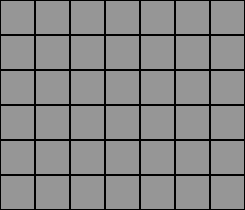
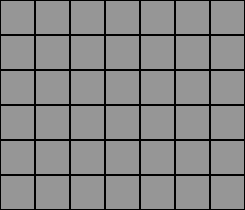

In [26]:
state = game.initial
net.propagate_to_features("main_input", nnplayer.state2inputs(state))

Now we make a move to (1,1). But note that after the move, it is now the other player's move. So the first move is seen on the opponent's board (the right side, feature #1):

Feature 0,Feature 1

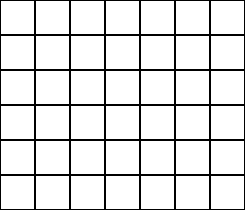
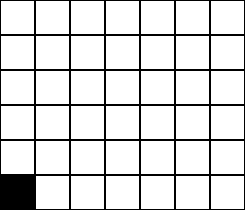

In [27]:
state = game.result(state, (1,1))
net.propagate_to_features("main_input", nnplayer.state2inputs(state))

Now, the second player moves to (2,1). Now we are back to the original perspective, and so the right-hand board is on the left, because that is now the current player's perspective.

Feature 0,Feature 1

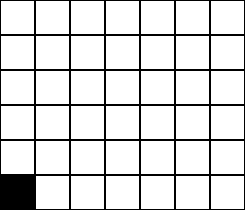
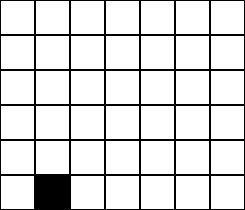

In [28]:
state = game.result(state, (2,1))
net.propagate_to_features("main_input", nnplayer.state2inputs(state))

Finally, we are ready to connect the game to the network. We define a function `get_predictions` that takes a game and state, and propagates it through the network returning a (value, probabilities, allowedActions). The probabilities are the pi list from the AlphaZero paper.

In [31]:
value, probs, acts = nnplayer.get_predictions(state)


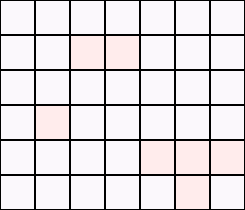
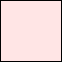
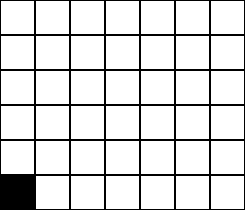

In [32]:
net.picture(nnplayer.state2inputs(state)) # uses this state as input to network

In [33]:
dash = net.dashboard()
dash

Dashboard(children=(Accordion(children=(HBox(children=(VBox(children=(Select(description='Dataset:', index=1, …

In [34]:
net.dataset.append(nnplayer.state2inputs(state), 
                   [[0 for i in range(42)], [1]])

In [35]:
output = dash.propagate(nnplayer.state2inputs(state))

## Testing Game and Network Integration

Finally, we turn the predictions into a move, and we can play a game with the network. Note that we won't actually play the game using this method (e.g., network determine move directly). Rather, we will use the network's output to inform a Monte Carlo Tree Search, which does a small about of search before each move. The network gives its perspective on what direction looks promising. In other words, it provides the "policy" for the search.

In [36]:
p1 = RandomPlayer()
p2 = NNPlayer("NNPlayer-2", make_network(game, netconfig))

In [37]:
p2.set_game(game)

In [38]:
p2.get_action(state, 2)

(4, 1)

In [39]:
game.play_game(p1, p2, verbose=0)

['NNPlayer-2']

In [40]:
game.display(game.final_state)

. . . . . . . 
. . . . . . . 
. X . . . . . 
. X . . . X . 
O X . O . O . 
X X O X O O . 


## Training The Network

Now we are ready to train the network. The training is a clever use of Monte Carlo Tree Search.

There is a Monte Carlo Tree Search player that we will use:

In [41]:
class MCTSPlayerWithNetPolicy(MCTSPlayer):
    """
    A Monte Carlo Tree Search with policy function from
    neural network. Network will be set later to self.nnplayer.
    """
    def __init__(self, name, net, n_playout, c_puct, is_selfplay,
                 turn_to_play_deterministically,
                 *args, **kwargs):
        super().__init__(name,
                         *args,
                         n_playout=n_playout,
                         c_puct=c_puct,
                         is_selfplay=is_selfplay,
                         **kwargs)
        self.net = net
        self.turn_to_play_deterministically = turn_to_play_deterministically
        self.memory = []

    def set_game(self, game):
        super().set_game(game)
        self.nnplayer = NNPlayer(self.name + "-NNPlayer", self.net)
        self.nnplayer.set_game(game)

    def get_action(self, state, turn, *args, **kwargs):
        if turn >= self.turn_to_play_deterministically:
            self.temp = 1e-3
        else:
            self.temp = 0.1
        move, pi = super().get_action(state, turn, *args, return_prob=True, **kwargs)
        self.memory.append((self.nnplayer.state2inputs(state),
                            self.move_probs2all_probs(pi)))
        return move

    def move_probs2all_probs(self, move_probs):
        all_probs = np.zeros(len(self.nnplayer.state2array(game.initial)))
        for move in move_probs:
            all_probs[self.nnplayer.move2pos[move]] = move_probs[move]
        return all_probs.tolist()

    def policy(self, game, state):
        # these moves are positions:
        value, probs_all, moves = self.nnplayer.get_predictions(state)
        if len(moves) == 0:
            result = [], value
        else:
            probs = np.array(probs_all)[moves]
            moves = [self.nnplayer.pos2move[pos] for pos in moves]
            # we need to return probs and moves for game
            result = [(act, prob) for (act, prob) in list(zip(moves, probs))], value
        return result

We make a special game class for collecting the memories of the played game. The game memories are composed of:

* [state [policy probabilities, win/loss value]

This is exactly the form needed for training the neural network, namely [inputs, targets].

In [42]:
class SelfPlayGame(ConnectFour):
    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)
        self.memory = []

    def play_game(self, *players, **kwargs):
        results = super().play_game(*players, **kwargs)
        value = self.final_utility
        for player in players:
            if hasattr(player, "memory"):
                for state, probs in player.memory:
                    self.memory.append([state, [probs, [value]]])
                player.memory[:] = []
        return results

    def play_tournament(self, *players, **kwargs):
        self.memory = []
        return super().play_tournament(*players, **kwargs)

Finally, we pull the details from the paper into the training method. It is composed of the following sections:

* best-player self-play, collects training data
* training on the current-player
* competition between best-player and current-player

In [43]:
def train(config):
    """
    The AlphaZero training method.
    """
    global memory
    for cycle in range(config.CYCLES):
        print("Cycle #%s..." % cycle)
        ########################################################
        # Phase 1: self-play, collect data
        ########################################################
        print("Self-play matches begin...")
        best_player1 = MCTSPlayerWithNetPolicy(
            "Best Player 1",
            best_net,
            config.N_PLAYOUT,
            config.C_PUCT,
            is_selfplay=True,
            turn_to_play_deterministically=config.TURN_TO_PLAY_DETERMINISTICALLY)
        best_player2 = MCTSPlayerWithNetPolicy(
            "Best Player 2",
            best_net,
            config.N_PLAYOUT,
            config.C_PUCT,
            is_selfplay=True,
            turn_to_play_deterministically=config.TURN_TO_PLAY_DETERMINISTICALLY)
        results = self_play_game.play_tournament(config.SELF_PLAY_MATCHES,
                                                 best_player1, best_player2)
        memory.extend(self_play_game.memory)
        ## Keep resonable size
        memory = memory[-config.MAX_MEMORY_SIZE:]
        print("Memory size is %s" % len(memory))
        if len(memory) >= config.MEMORY_SIZE:
            ########################################################
            # Phase 2: Train the current player with data collected:
            ########################################################
            print("Enough to train!")
            current_net.dataset.load(memory)
            current_net.train(config.TRAINING_EPOCHS_PER_CYCLE,
                                     batch_size=config.BATCH_SIZE, plot=False)
            ########################################################
            # Phase 3: Play current_player vs. best_player
            ########################################################
            ## If current is better thn best, move the current weights to best
            best_player = MCTSPlayerWithNetPolicy(
                "Best Player",
                best_net,
                config.N_PLAYOUT,
                config.C_PUCT,
                is_selfplay=False,
                turn_to_play_deterministically=1)
            current_player = MCTSPlayerWithNetPolicy(
                "Current Player",
                current_net,
                config.N_PLAYOUT,
                config.C_PUCT,
                is_selfplay=False,
                turn_to_play_deterministically=1)
            results = game.play_tournament(config.TOURNAMENT_MATCHES,
                                           best_player, current_player)
            print("Tournament results:", results)
            if results["Current Player"] > results["Best Player"] * config.BEST_SWAP_PERCENT:
                print("Current player won! swapping weights...")
                # copy the better weights to the best_player
                wts = current_net.get_weights()
                best_net.model.set_weights(wts)
                best_net.save_weights("BestWeights-%s.conx" % cycle)
            else:
                print("Best player remains best.")

Now we construct the config object for building and running a full experiment:

In [44]:
Config = namedtuple("Config", [
    "CYCLES",
    "MEMORY_SIZE",
    "MAX_MEMORY_SIZE",
    "TRAINING_EPOCHS_PER_CYCLE",
    "BATCH_SIZE",
    "LEARNING_RATE",
    "MOMENTUM",
    "SELF_PLAY_MATCHES",
    "TURN_TO_PLAY_DETERMINISTICALLY",
    "C_PUCT",
    "TOURNAMENT_MATCHES",
    "BEST_SWAP_PERCENT",
    "N_PLAYOUT",
])

And give it some settings:

In [45]:
config = Config(
    CYCLES=10, # number of cycles to run
    MEMORY_SIZE=1000, # min size of memory
    MAX_MEMORY_SIZE=30000, # min size of memory
    TRAINING_EPOCHS_PER_CYCLE=1, # training on current network
    BATCH_SIZE=256, # batch_size for NN training
    LEARNING_RATE=0.1, # SGD Learning rate
    MOMENTUM=0.9, # SGD Momentum
    SELF_PLAY_MATCHES=25, # matches to test yo' self per self-play round
    TURN_TO_PLAY_DETERMINISTICALLY=10, # for selfplay mode
    C_PUCT=1.0, # rely on priors (0, +Infinity]
    TOURNAMENT_MATCHES=20, # plays each player as first mover per match, so * 2
    BEST_SWAP_PERCENT=1.3, # you must be this much better than best
    N_PLAYOUT=50, # number of MCTS simulations
)

We construct the global values needed for the training program:

In [46]:
self_play_game = SelfPlayGame(notebook=True)
game = ConnectFour(notebook=True)
memory = []
## The nets:
best_net = make_network(self_play_game, config)
current_net = make_network(self_play_game, config)

And we are ready for training to begin:

In [55]:
train(config)

Cycle #0...
Self-play matches begin...


HBox(children=(IntProgress(value=0, max=50), HTML(value='')))


Memory size is 9189
Enough to train!
Training...
       |  Training |    policy |     value 
Epochs |     Error |  head acc |  head acc 
------ | --------- | --------- | --------- 
#    9 |   1.17491 |   0.00000 |   0.03862 
#   10 |   1.17060 |   0.00000 |   0.04233 
#   10 |   1.17060 |   0.00000 |   0.04233 


HBox(children=(IntProgress(value=0, max=40), HTML(value='')))


Tournament results: {'DRAW': 22, 'Best Player': 18, 'Current Player': 0}
Best player remains best.
Cycle #1...
Self-play matches begin...


HBox(children=(IntProgress(value=0, max=50), HTML(value='')))


Memory size is 9985
Enough to train!
Training...
       |  Training |    policy |     value 
Epochs |     Error |  head acc |  head acc 
------ | --------- | --------- | --------- 
#   10 |   1.17060 |   0.00000 |   0.04233 
#   11 |   1.12544 |   0.00000 |   0.06700 
#   11 |   1.12544 |   0.00000 |   0.06700 


HBox(children=(IntProgress(value=0, max=40), HTML(value='')))


Tournament results: {'DRAW': 0, 'Best Player': 23, 'Current Player': 17}
Best player remains best.
Cycle #2...
Self-play matches begin...


HBox(children=(IntProgress(value=0, max=50), HTML(value='')))


Memory size is 10721
Enough to train!
Training...
       |  Training |    policy |     value 
Epochs |     Error |  head acc |  head acc 
------ | --------- | --------- | --------- 
#   11 |   1.12544 |   0.00000 |   0.06700 
#   12 |   1.31742 |   0.00000 |   0.00578 
#   12 |   1.31742 |   0.00000 |   0.00578 


HBox(children=(IntProgress(value=0, max=40), HTML(value='')))


Tournament results: {'DRAW': 0, 'Best Player': 19, 'Current Player': 21}
Best player remains best.
Cycle #3...
Self-play matches begin...


HBox(children=(IntProgress(value=0, max=50), HTML(value='')))


Memory size is 11456
Enough to train!
Training...
       |  Training |    policy |     value 
Epochs |     Error |  head acc |  head acc 
------ | --------- | --------- | --------- 
#   12 |   1.31742 |   0.00000 |   0.00578 
#   13 |   1.20680 |   0.00000 |   0.01440 
#   13 |   1.20680 |   0.00000 |   0.01440 


HBox(children=(IntProgress(value=0, max=40), HTML(value='')))


Tournament results: {'DRAW': 23, 'Best Player': 0, 'Current Player': 17}
Current player won! swapping weights...
Cycle #4...
Self-play matches begin...


HBox(children=(IntProgress(value=0, max=50), HTML(value='')))


Memory size is 12129
Enough to train!
Training...
       |  Training |    policy |     value 
Epochs |     Error |  head acc |  head acc 
------ | --------- | --------- | --------- 
#   13 |   1.20680 |   0.00000 |   0.01440 
#   14 |   1.16041 |   0.00000 |   0.03595 
#   14 |   1.16041 |   0.00000 |   0.03595 


HBox(children=(IntProgress(value=0, max=40), HTML(value='')))


Tournament results: {'DRAW': 0, 'Best Player': 20, 'Current Player': 20}
Best player remains best.
Cycle #5...
Self-play matches begin...


HBox(children=(IntProgress(value=0, max=50), HTML(value='')))


Memory size is 12812
Enough to train!
Training...
       |  Training |    policy |     value 
Epochs |     Error |  head acc |  head acc 
------ | --------- | --------- | --------- 
#   14 |   1.16041 |   0.00000 |   0.03595 
#   15 |   1.13019 |   0.00000 |   0.05768 
#   15 |   1.13019 |   0.00000 |   0.05768 


HBox(children=(IntProgress(value=0, max=40), HTML(value='')))


Tournament results: {'DRAW': 16, 'Best Player': 0, 'Current Player': 24}
Current player won! swapping weights...
Cycle #6...
Self-play matches begin...


HBox(children=(IntProgress(value=0, max=50), HTML(value='')))


Memory size is 13535
Enough to train!
Training...
       |  Training |    policy |     value 
Epochs |     Error |  head acc |  head acc 
------ | --------- | --------- | --------- 
#   15 |   1.13019 |   0.00000 |   0.05768 
#   16 |   1.11785 |   0.00000 |   0.06686 
#   16 |   1.11785 |   0.00000 |   0.06686 


HBox(children=(IntProgress(value=0, max=40), HTML(value='')))


Tournament results: {'DRAW': 0, 'Best Player': 22, 'Current Player': 18}
Best player remains best.
Cycle #7...
Self-play matches begin...


HBox(children=(IntProgress(value=0, max=50), HTML(value='')))


Memory size is 14252
Enough to train!
Training...
       |  Training |    policy |     value 
Epochs |     Error |  head acc |  head acc 
------ | --------- | --------- | --------- 
#   16 |   1.11785 |   0.00000 |   0.06686 
#   17 |   1.08456 |   0.00000 |   0.08869 
#   17 |   1.08456 |   0.00000 |   0.08869 


HBox(children=(IntProgress(value=0, max=40), HTML(value='')))


Tournament results: {'DRAW': 24, 'Best Player': 16, 'Current Player': 0}
Best player remains best.
Cycle #8...
Self-play matches begin...


HBox(children=(IntProgress(value=0, max=50), HTML(value='')))


Memory size is 15012
Enough to train!
Training...
       |  Training |    policy |     value 
Epochs |     Error |  head acc |  head acc 
------ | --------- | --------- | --------- 
#   17 |   1.08456 |   0.00000 |   0.08869 
#   18 |   1.06326 |   0.00000 |   0.09959 
#   18 |   1.06326 |   0.00000 |   0.09959 


HBox(children=(IntProgress(value=0, max=40), HTML(value='')))


Tournament results: {'DRAW': 0, 'Best Player': 40, 'Current Player': 0}
Best player remains best.
Cycle #9...
Self-play matches begin...


HBox(children=(IntProgress(value=0, max=50), HTML(value='')))


Memory size is 15737
Enough to train!
Training...
       |  Training |    policy |     value 
Epochs |     Error |  head acc |  head acc 
------ | --------- | --------- | --------- 
#   18 |   1.06326 |   0.00000 |   0.09959 
#   19 |   1.03777 |   0.00000 |   0.11826 
#   19 |   1.03777 |   0.00000 |   0.11826 


HBox(children=(IntProgress(value=0, max=40), HTML(value='')))


Tournament results: {'DRAW': 0, 'Best Player': 18, 'Current Player': 22}
Best player remains best.


## Analysis

It can take hours and hours to run the above cell (and you can run that cell multiple times.) In the above example, it ran for 19 training steps. Let's see how it did:

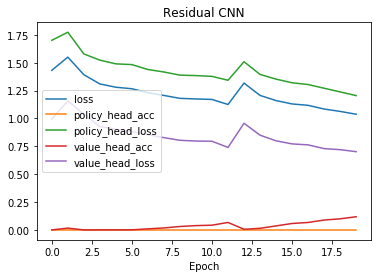

In [85]:
current_net.plot("all")

To test the final best-player, we can play a tournament between any types of players:

In [56]:
new_game = ConnectFour(notebook=True)

random_player = RandomPlayer("Rando")
best_player = MCTSPlayerWithNetPolicy(
    "Best Player",
    best_net,
    config.N_PLAYOUT,
    config.C_PUCT,
    is_selfplay=False,
    turn_to_play_deterministically=1)


In [57]:
new_game.play_tournament(10, best_player, random_player)

HBox(children=(IntProgress(value=0, max=20), HTML(value='')))

{'Best Player': 19, 'DRAW': 0, 'Rando': 1}

In [58]:
mctsplayer = MCTSPlayer(
    "MCTSPlayer",
    config.N_PLAYOUT,
    config.C_PUCT,
    is_selfplay=False)

In [59]:
new_game.play_tournament(10, best_player, mctsplayer)

HBox(children=(IntProgress(value=0, max=20), HTML(value='')))

{'Best Player': 20, 'DRAW': 0, 'MCTSPlayer': 0}

In [60]:
abplayer = AlphaBetaCutoffPlayer()

In [61]:
new_game.play_tournament(10, best_player, abplayer)

HBox(children=(IntProgress(value=0, max=20), HTML(value='')))

{'AlphaBetaCutoffPlayer-2': 0, 'Best Player': 20, 'DRAW': 0}

## Summary

AlphaZero is a very interesting network and training algorithm. It exhibits some features that we understand from classical AI and modern neural networks. It works very well because it play against itself, at just the right level, evolution-style.

Could the AlphaZero strategy work on problems other than perfect information, turn-based board games?